# Data Ingestion

Machine learning tasks are typically data heavy, requiring labelled data for supervised learning or unlabelled data for unsupervised learning. In Python, data is typically stored in memory as NumPy arrays at some level, but in most cases you can use higher-level containers built on top of NumPy that are more convenient for tabular data ([Pandas](http://pandas.pydata.org)), multidimensional gridded data ([xarray](http://xarray.pydata.org)), or out-of-core and distributed data ([Dask](http://dask.pydata.org)).  

Each of these libraries allows reading local data in a variety of formats.  In many cases the required datasets are large and stored on remote servers, so we will show how to use the [Intake](https://intake.readthedocs.io) library to fetch remote datasets efficiently, including built-in caching to avoid unncessary downloads when the files are available locally.

To ensure that you understand the properties of your data and how it gets transformed at each step in the workflow, we will use exploratory visualization tools as soon as the data is available and at every subsequent step.

Once you have loaded your data, you will typically need to reshape it appropriately before it can be fed into a machine learning pipeline. Those steps will be detailed in the next tutorial: [Alignment and Preprocessing](03_Alignment_and_Preprocessing.ipynb).  

In [2]:
import os, sys
from pathlib import Path

UTILS_DIR = Path('../utils').absolute()
assert UTILS_DIR.exists()
if str(UTILS_DIR) not in sys.path:
    sys.path.insert(0, str(UTILS_DIR))
print(sys.path)
    

['/home/hayley/Playground/Geo/EarthML/examples/tutorial/../utils', '', '/home/hayley/Playground/Geo/EarthML/examples/tutorial', '/home/hayley/miniconda3/envs/earthml/lib/python37.zip', '/home/hayley/miniconda3/envs/earthml/lib/python3.7', '/home/hayley/miniconda3/envs/earthml/lib/python3.7/lib-dynload', '/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages', '/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/IPython/extensions', '/home/hayley/.ipython']


In [3]:
from utils import get_mro, nprint

## Inline loading

We'll start with the simple case of loading small local datasets, such as a .csv file for Pandas:

In [4]:
import pandas as pd

training_df = pd.read_csv('../data/landsat5_training.csv')

We can inspect the first several lines of the file using ``.head``, or a random set of rows using ``.sample(n)``

In [5]:
training_df.head();
training_df.sample(5)

,image,type,easting,northing,red,green,blue,nir,ndvi,bn,bnn
12,LT05_L1TP_042033_19881022_20161001_01_T1,back,447090.0,4268640.0,1272,1113,20000,1628,0.122759,12.285012,-0.849454
8,LT05_L1TP_042033_19881022_20161001_01_T1,veg,345900.0,4360830.0,359,507,349,5407,0.875477,0.064546,0.878735
14,LT05_L1TP_042033_19881022_20161001_01_T1,back,471420.0,4362540.0,1970,1613,20000,2436,0.105765,8.210180,-0.782849
9,LT05_L1TP_042033_19881022_20161001_01_T1,veg,353700.0,4379160.0,366,661,459,5673,0.878788,0.080910,0.850294
1,LT05_L1TP_042033_19881022_20161001_01_T1,water,338690.0,4323890.0,620,656,527,433,-0.177588,1.217090,-0.097917


To get a better sense of how this dataframe is set up, we can look at ``.info()``

In [6]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 11 columns):
image       22 non-null object
type        22 non-null object
easting     22 non-null float64
northing    22 non-null float64
red         22 non-null int64
green       22 non-null int64
blue        22 non-null int64
nir         22 non-null int64
ndvi        22 non-null float64
bn          22 non-null float64
bnn         22 non-null float64
dtypes: float64(5), int64(4), object(2)
memory usage: 2.0+ KB


To use methods like `pd.read_csv`, the data all needs to be on the local filesystem (or on one of the limited remote specification formats supported by Pandas, such as S3). We could of course put in various commands here to fetch a file explicitly from a remote server, but the notebook would then very quickly get complex and unreadable.

Instead, for larger datasets, we can automate those steps using intake so that remote and local data can be treated similarly. 

In [7]:
import intake

training = intake.open_csv('../data/landsat5_training.csv')

/home/hayley/miniconda3/envs/earthml/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/intake/source/cache.py:434: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  class CacheMetadata(collections.MutableMapping):


To get better insight into the data without loading it all in just yet, we can inspect the data using ``.to_dask()``

In [8]:
training_dd = training.to_dask() # doesn't actually load the whole data
training_dd.head() 

,image,type,easting,northing,red,green,blue,nir,ndvi,bn,bnn
0,LT05_L1TP_042033_19881022_20161001_01_T1,water,348586.0,4286269.0,182,351,319,130,-0.166667,2.453846,-0.420935
1,LT05_L1TP_042033_19881022_20161001_01_T1,water,338690.0,4323890.0,620,656,527,433,-0.177588,1.217090,-0.097917
2,LT05_L1TP_042033_19881022_20161001_01_T1,veg,345930.0,4360830.0,358,506,272,5411,0.875888,0.050268,0.904276
3,LT05_L1TP_042033_19881022_20161001_01_T1,veg,344490.0,4363590.0,343,639,374,5826,0.888799,0.064195,0.879355
4,LT05_L1TP_042033_19881022_20161001_01_T1,veg,346410.0,4360620.0,360,611,325,5405,0.875108,0.060130,0.886562


In [9]:
training_dd.info() # since we didn't actually load in the entire dataset, we don't know the length of the dataframe

<class 'dask.dataframe.core.DataFrame'>
Columns: 11 entries, image to bnn
dtypes: object(2), float64(5), int64(4)

To get a full pandas.DataFrame object, use ``.read()`` to load in all the data.

In [10]:
training_df = training.read()
training_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 11 columns):
image       22 non-null object
type        22 non-null object
easting     22 non-null float64
northing    22 non-null float64
red         22 non-null int64
green       22 non-null int64
blue        22 non-null int64
nir         22 non-null int64
ndvi        22 non-null float64
bn          22 non-null float64
bnn         22 non-null float64
dtypes: float64(5), int64(4), object(2)
memory usage: 2.0+ KB


**NOTE:** There are different items in these two info views which reflect what is knowable before and after we read all the data. For instance, it is not possible to know the ``shape`` of the whole dataset before it is loaded.

## Loading multiple files

In addition to allowing partitioned reading of files, intake lets the user load and concatenate data across multiple files in one command

In [11]:
training = intake.open_csv(['../data/landsat5_training.csv', '../data/landsat8_training.csv'])

In [12]:
training_df = training.read()
training_df.info()
training_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50 entries, 0 to 27
Data columns (total 11 columns):
image       50 non-null object
type        50 non-null object
easting     50 non-null float64
northing    50 non-null float64
red         50 non-null int64
green       50 non-null int64
blue        50 non-null int64
nir         50 non-null int64
ndvi        50 non-null float64
bn          50 non-null float64
bnn         50 non-null float64
dtypes: float64(5), int64(4), object(2)
memory usage: 4.7+ KB


,image,type,easting,northing,red,green,blue,nir,ndvi,bn,bnn
0,LT05_L1TP_042033_19881022_20161001_01_T1,water,348586.0,4286269.0,182,351,319,130,-0.166667,2.453846,-0.420935
1,LT05_L1TP_042033_19881022_20161001_01_T1,water,338690.0,4323890.0,620,656,527,433,-0.177588,1.217090,-0.097917
2,LT05_L1TP_042033_19881022_20161001_01_T1,veg,345930.0,4360830.0,358,506,272,5411,0.875888,0.050268,0.904276
3,LT05_L1TP_042033_19881022_20161001_01_T1,veg,344490.0,4363590.0,343,639,374,5826,0.888799,0.064195,0.879355
4,LT05_L1TP_042033_19881022_20161001_01_T1,veg,346410.0,4360620.0,360,611,325,5405,0.875108,0.060130,0.886562


**NOTE:** The length of the dataframe has increased now that we are loading multiple sets of training data.

This can be more simply expressed as:

In [13]:
training = intake.open_csv('../data/landsat*_training.csv')

Sometimes, there is data encoded in a file name or path that causes concatenated data to lose some important context. In this example, we lose the information about which version of landsat the training was done on. To keep track of that information, we can use a python format string to specify our path and declare a new field on our data. That field will get populated based on its value in the path. 

In [14]:
training = intake.open_csv('../data/landsat{version:d}_training.csv')
training_df = training.read()
training_df.head()

,image,type,easting,northing,red,green,blue,nir,ndvi,bn,bnn,version
0,LT05_L1TP_042033_19881022_20161001_01_T1,water,348586.0,4286269.0,182,351,319,130,-0.166667,2.453846,-0.420935,5
1,LT05_L1TP_042033_19881022_20161001_01_T1,water,338690.0,4323890.0,620,656,527,433,-0.177588,1.217090,-0.097917,5
2,LT05_L1TP_042033_19881022_20161001_01_T1,veg,345930.0,4360830.0,358,506,272,5411,0.875888,0.050268,0.904276,5
3,LT05_L1TP_042033_19881022_20161001_01_T1,veg,344490.0,4363590.0,343,639,374,5826,0.888799,0.064195,0.879355,5
4,LT05_L1TP_042033_19881022_20161001_01_T1,veg,346410.0,4360620.0,360,611,325,5405,0.875108,0.060130,0.886562,5


In [15]:
# Exercise: Try looking at the tail of the data using training_df.tail(), or a random sample using training_df.sample(5)

## Using Catalogs

For more complicated setups, we use the file catalog.yml to declare how the data should be loaded. The catalog lays out how the data should be loaded, defines some metadata, and specifies any patterns in the file path that should be included in the data. Here is an example of a catalog entry:

```
sources:
  landsat_5_small:
    description: Small version of Landsat 5 Surface Reflectance Level-2 Science Product.
    driver: rasterio
    cache:
      - argkey: urlpath
        regex: 'earth-data/landsat'
        type: file
    args:
      urlpath: 's3://earth-data/landsat/small/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band{band:d}.tif'
      chunks:
        band: 1
        x: 50
        y: 50
      concat_dim: band
      storage_options: {'anon': True}
```

The ``urlpath`` can be a path to a file, list of files, or a path with glob notation. Alternatively the path can be written as a python style [format_string](https://docs.python.org/3.6/library/string.html#format-string-syntax). In the case where the ``urlpath`` is a format string, the fields specified in that string will be parsed from the filenames and returned in the data. 

In [16]:
cat = intake.open_catalog('../catalog.yml')
list(cat)

/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/intake/catalog/local.py:566: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(text)


['landsat_5_small',
 'landsat_8_small',
 'landsat_5',
 'landsat_8',
 'google_landsat_band',
 'amazon_landsat_band',
 'fluxnet_daily',
 'fluxnet_metadata',
 'seattle_lidar']

In [17]:
# Exercise: Read the description of the landsat_5_small data source using cat.landsat_5_small.description
cat.landsat_5_small.describe()

{'container': 'xarray',
 'description': 'Small version of Landsat 5 Surface Reflectance Level-2 Science Product.',
 'direct_access': 'forbid',
 'user_parameters': []}

**NOTE:** If you don't have the data cached yet, then the next cell will take a few seconds.

In [18]:
landsat_5 = cat.landsat_5_small
landsat_5.to_dask()

<xarray.DataArray (band: 6, y: 300, x: 300)>
dask.array<shape=(6, 300, 300), dtype=float64, chunksize=(1, 50, 50)>
Coordinates:
  * y        (y) float64 4.309e+06 4.309e+06 4.309e+06 ... 4.264e+06 4.264e+06
  * x        (x) float64 3.324e+05 3.326e+05 3.327e+05 ... 3.771e+05 3.772e+05
  * band     (band) int64 1 2 3 4 5 7
Attributes:
    transform:   (150.0, 0.0, 332325.0, 0.0, -150.0, 4309275.0)
    crs:         +init=epsg:32611
    res:         (150.0, 150.0)
    is_tiled:    0
    nodatavals:  (nan,)

The data has not yet been loaded so we don't have access to the actual data values yet, but we do have access to coordinates and metadata.

## Visualizing the data

To get a quick sense of the data, we can plot it using [hvPlot](https://hvplot.pyviz.org/), which provides interactive plotting commands for Intake, Pandas, XArray, Dask, and GeoPandas. We'll look more closely at hvPlot and its options in later tutorials.

/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/bokeh/plotting/helpers.py:21: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable, OrderedDict, Sequence


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
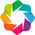

In [19]:
import hvplot.intake
intake.output_notebook()

import holoviews as hv
hv.extension('bokeh')

We can quickly generate a plot of each of the landsat bands using the overview plot declared in the catalog. Here is the relevant part of `catalog.yml`:

```
metadata:
  plots:
    band_image:
      kind: 'image'
      x: 'x'
      y: 'y'
      groupby: 'band'
      rasterize: True
      width: 400
      dynamic: False
```

In [20]:
landsat_5.hvplot.band_image()

/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/holoviews/operation/datashader.py:3: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Callable, Iterable
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/datashader/transfer_functions.py:3: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterator
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/numba/npyufunc/dufunc.py:86: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() or inspect.getfullargspec()
  super(DUFunc, self).__init__(dispatcher, **kws)
/home/hayley/miniconda3/envs/earthml/lib/python3.7/site-packages/numba/npyufunc/dufunc.py:86: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signatu

:HoloMap   [band]
   :Image   [x,y]   (value)

In [105]:
landsat_5.plots

['band_image']

## Accessing the data
So far we have been looking at the intake data entry object `landsat_5`. To access the data on this object we will read the data. If the data are big, we can use dask to do this using the `.to_dask()` method to create a `dask xarray.DataArray`. If the data are small, then we can use the `read()` method to read all the data straight into a regular `xarray.DataArray`. Once in an `xarray` object the data can be more easily manipulated and visualized.

In [87]:
type(landsat_5)

intake.catalog.local.LocalCatalogEntry

### Xarray DataArray
To get an `xarray` object, we'll use the `.read()` method.

In [88]:
landsat_5_xda = landsat_5.read()
type(landsat_5_xda)

xarray.core.dataarray.DataArray

We can use tab completion to explore what other information is stored on our xarray.DataArray object. We can use tab completion to explore attributes and methods available on our object.

In [89]:
# Exercise: Try typing landsat_5_xda. and press [tab] - don't forget the trailing dot!
landsat_5_xda.crs

'+init=epsg:32611'

### Numpy Array
Machine Learning pipelines such as scikit-learn accept Numpy arrays as input. These arrays are accessible in DataArray objects on the `values` attribute.

In [ ]:
landsat_5_npa = landsat_5_xda.values
type(landsat_5_npa)

### Next:

Now that you have loaded your data, you will typically need to reshape it appropriately before it can be fed into a machine-learning pipeline. These steps are detailed in the next tutorial: [Alignment and Preprocessing](03_Alignment_and_Preprocessing.ipynb).